# Proof of Value for applying same visual style between cmp_facade_dataset images and Nelissen target images (sketches)

## **Remove details in original image**

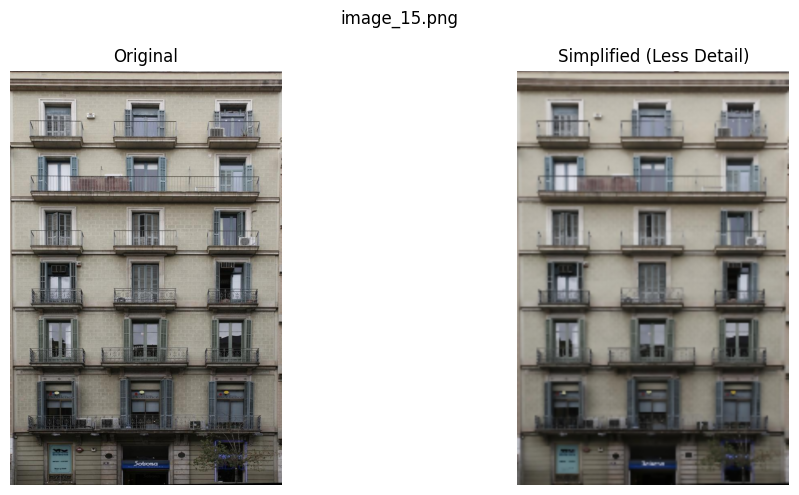

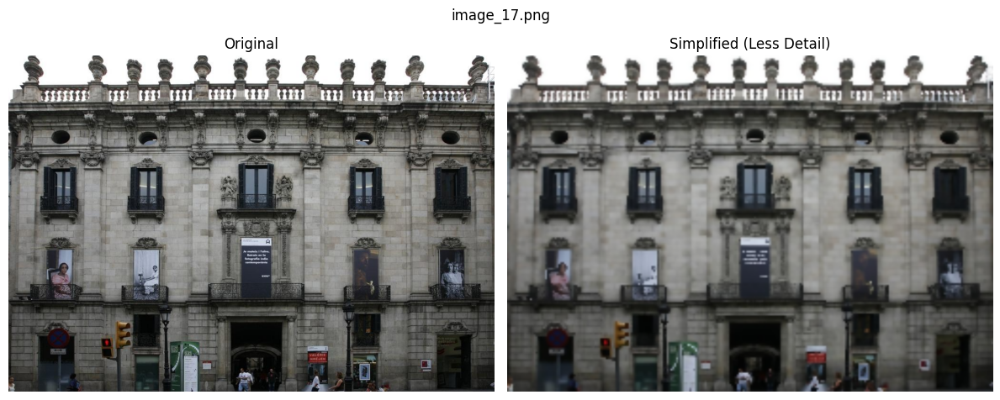

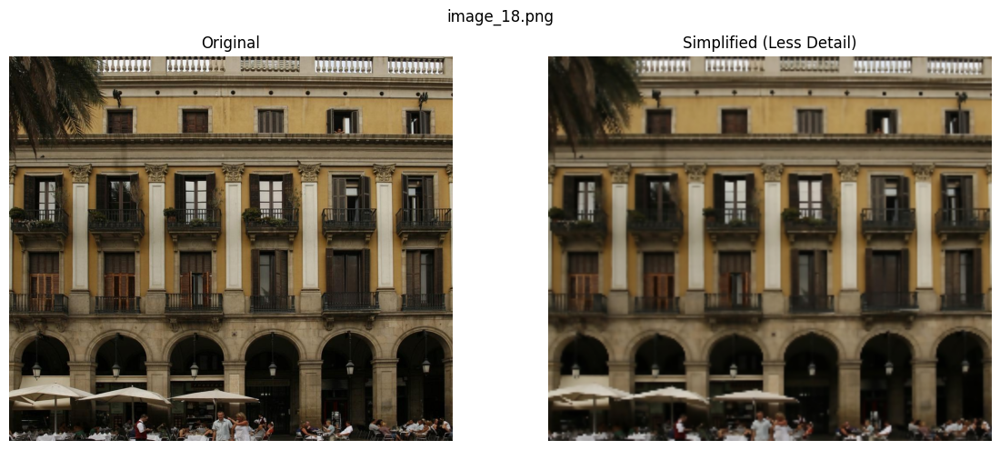

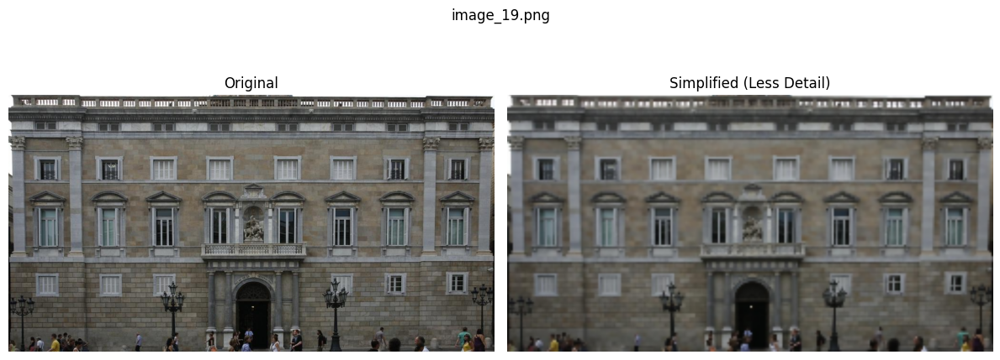

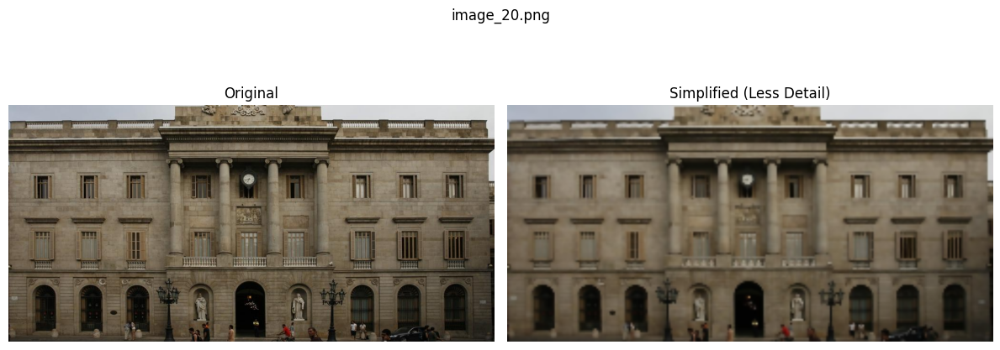

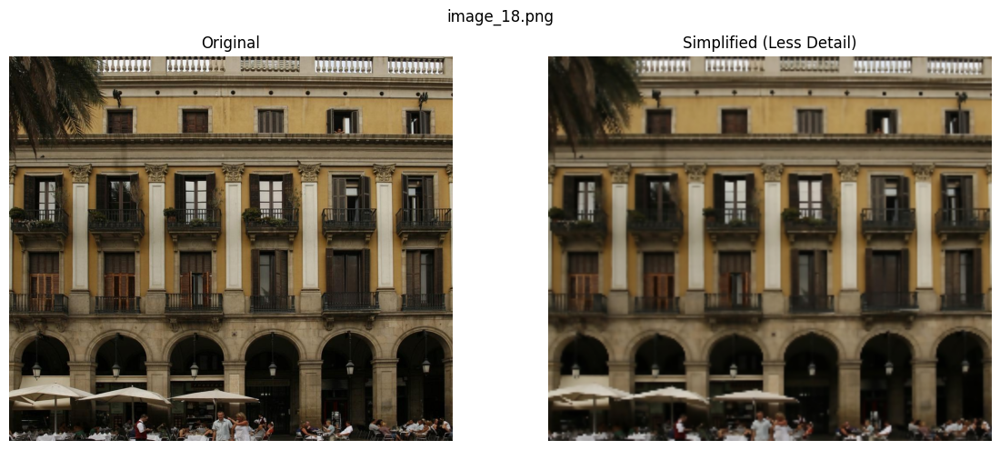

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# List of image paths
image_paths = [
    '../data/cmp_facade_dataset/images/train/image_15.png',
    '../data/cmp_facade_dataset/images/train/image_17.png',
    '../data/cmp_facade_dataset/images/train/image_18.png',
    '../data/cmp_facade_dataset/images/train/image_19.png',
    '../data/cmp_facade_dataset/images/train/image_20.png',
    '../data/cmp_facade_dataset/images/train/image_18.png'
]

# Dictionary to store results
simplified_results = {}

for path in image_paths:
    image = cv2.imread(path)
    if image is None:
        print(f"Failed to load: {path}")
        continue

    # Step 1: Bilateral filter (smooths detail but keeps edges)
    smoothed = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

    # Step 2: Downscale + Upscale to remove fine texture
    small = cv2.resize(smoothed, (image.shape[1] // 4, image.shape[0] // 4))
    simplified = cv2.resize(small, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_LINEAR)

    # Convert BGR to RGB for plotting
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    simplified_rgb = cv2.cvtColor(simplified, cv2.COLOR_BGR2RGB)

    # Show before and after
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(simplified_rgb)
    plt.title("Simplified (Less Detail)")
    plt.axis('off')

    filename = os.path.basename(path)
    plt.suptitle(filename, fontsize=12)
    plt.tight_layout()
    plt.show()

    # Store in dictionary for later use if needed
    simplified_results[filename] = {
        'original': image,
        'simplified': simplified
    }


## **Proprocess original image with less details.**

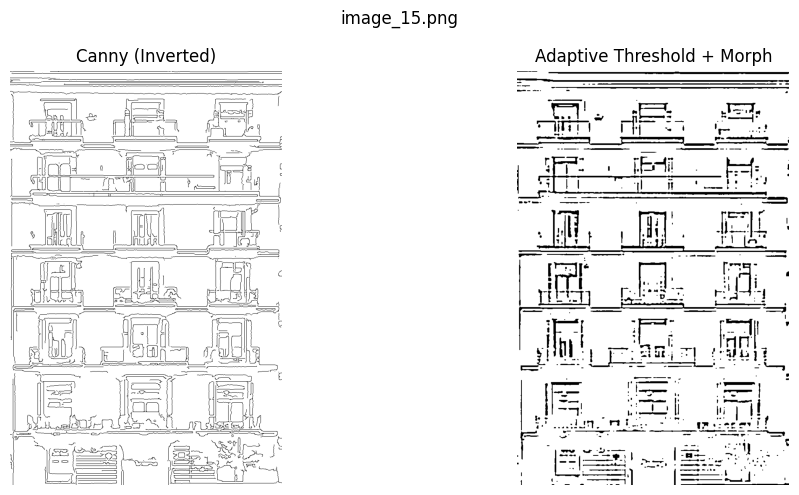

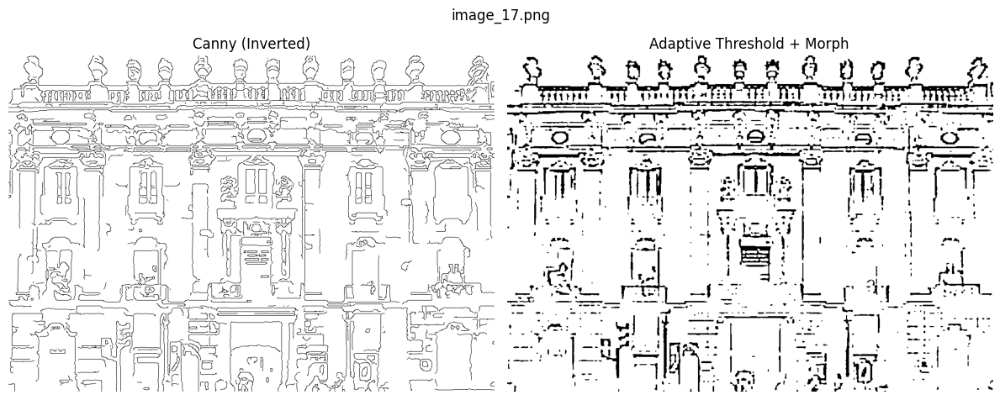

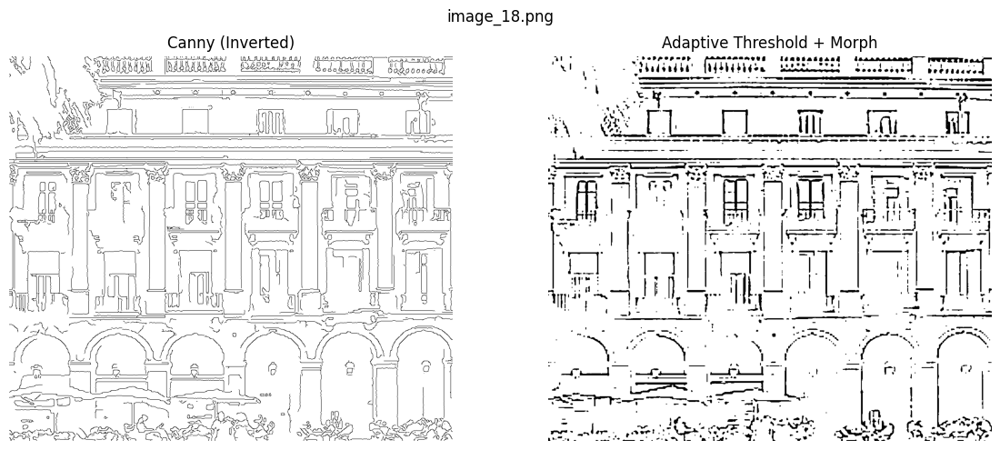

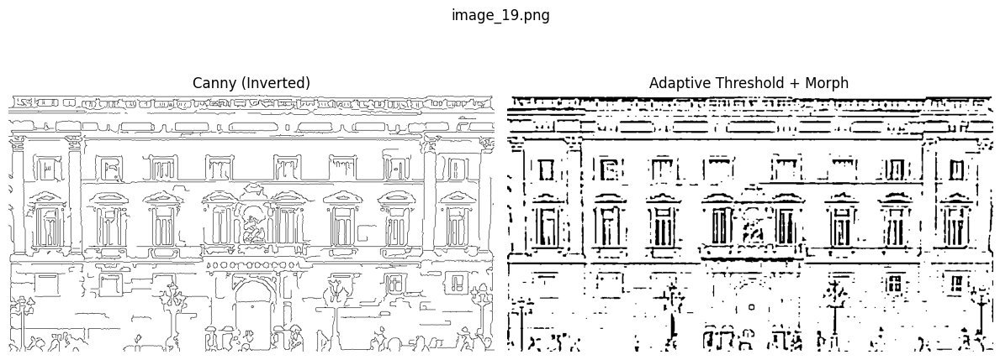

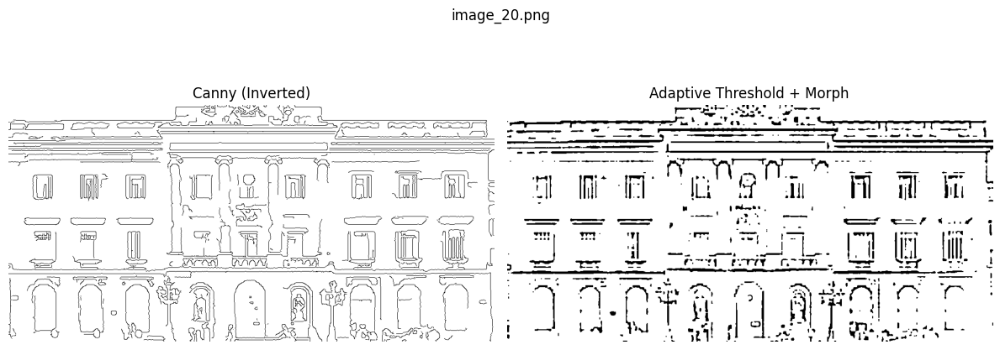

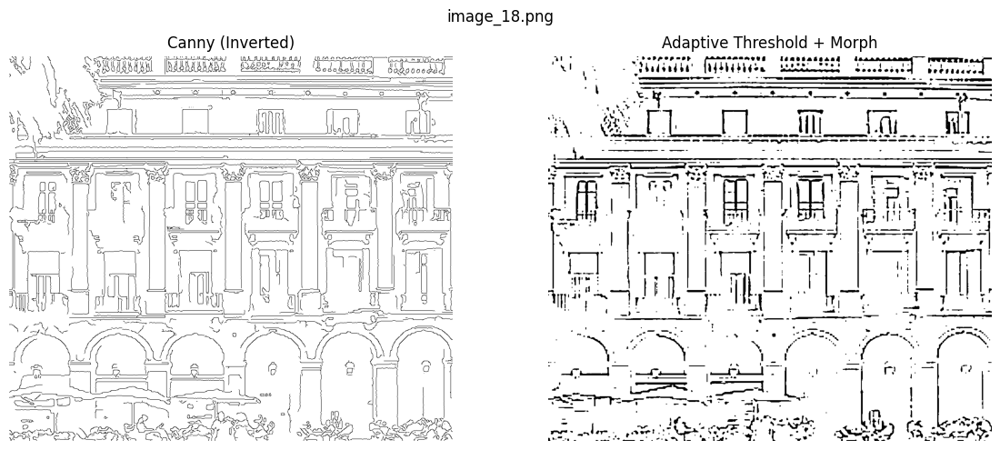

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# List of image paths
image_paths = [
    '../data/cmp_facade_dataset/images/train/image_15.png',
    '../data/cmp_facade_dataset/images/train/image_17.png',
    '../data/cmp_facade_dataset/images/train/image_18.png',
    '../data/cmp_facade_dataset/images/train/image_19.png',
    '../data/cmp_facade_dataset/images/train/image_20.png',
    '../data/cmp_facade_dataset/images/train/image_18.png'
]

# Dictionary to store results
processed_results = {}

for path in image_paths:
    image = cv2.imread(path)
    if image is None:
        print(f"Failed to load: {path}")
        continue

    # STEP 1: Simplify the image
    smoothed = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)
    small = cv2.resize(smoothed, (image.shape[1] // 4, image.shape[0] // 4))
    simplified = cv2.resize(small, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_LINEAR)

    # STEP 2: Preprocessing pipeline
    gray = cv2.cvtColor(simplified, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE to enhance contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    gray_eq = clahe.apply(gray)

    # Gaussian blur
    blurred = cv2.GaussianBlur(gray_eq, (5, 5), 0)

    # Canny edge detection (invert for sketch look)
    edges = cv2.Canny(blurred, 30, 100)
    sketch = cv2.bitwise_not(edges)

    # Adaptive thresholding
    sketch1 = cv2.adaptiveThreshold(blurred, 255,
                                    cv2.ADAPTIVE_THRESH_MEAN_C,
                                    cv2.THRESH_BINARY, 9, 10)

    # Morphological cleanup
    kernel = np.ones((2, 2), np.uint8)
    sketch1_morph = cv2.morphologyEx(sketch1, cv2.MORPH_CLOSE, kernel)

    # Show results
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(sketch, cmap='gray')
    plt.title('Canny (Inverted)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(sketch1_morph, cmap='gray')
    plt.title('Adaptive Threshold + Morph')
    plt.axis('off')

    plt.suptitle(os.path.basename(path), fontsize=12)
    plt.tight_layout()
    plt.show()

    # Save outputs for further analysis if needed
    name = os.path.basename(path)
    processed_results[name] = {
        'simplified': simplified,
        'gray_eq': gray_eq,
        'canny_inverted': sketch,
        'adaptive_thresh': sketch1,
        'adaptive_thresh_morph': sketch1_morph
    }


## **CMP Facade Dataset "Complex" Preprocessing**

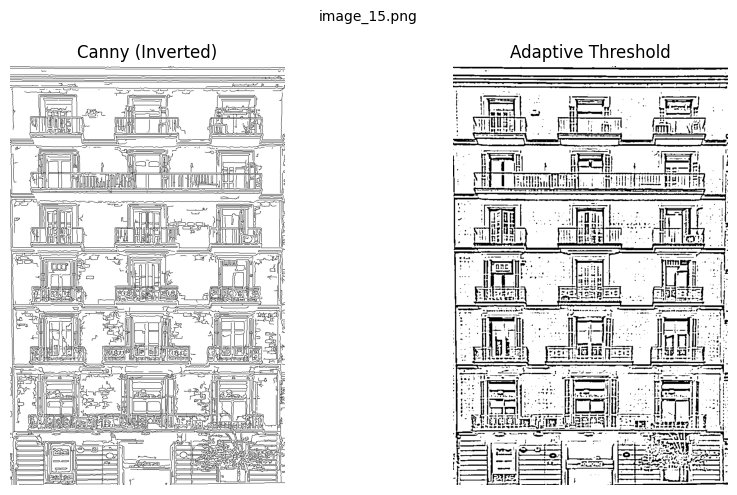

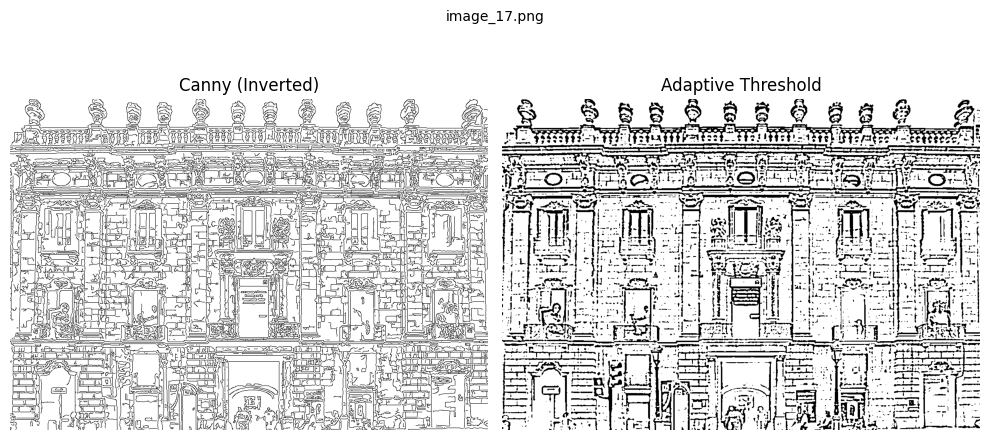

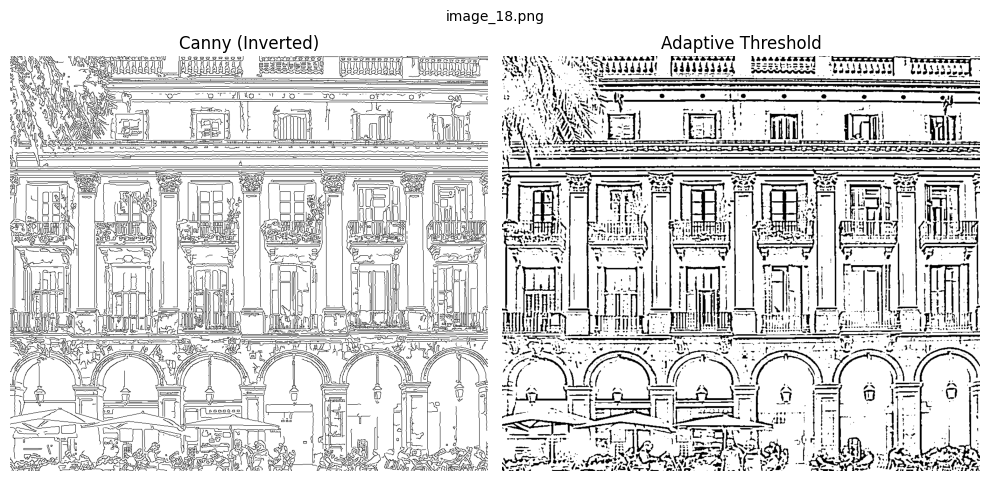

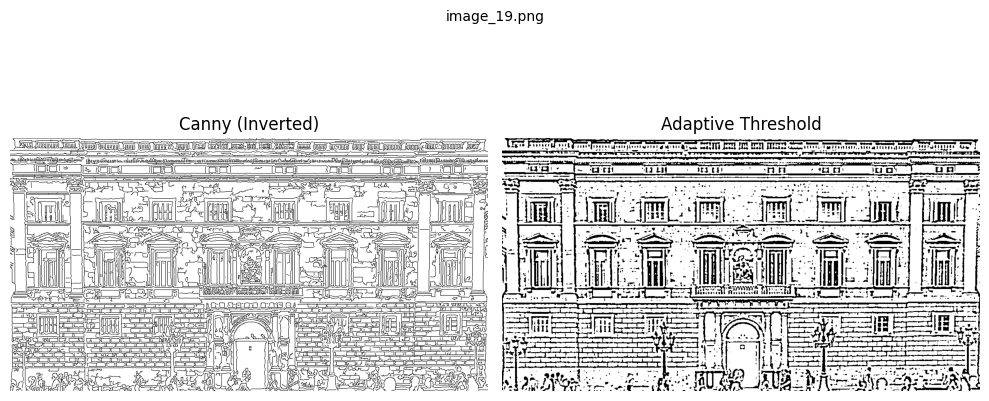

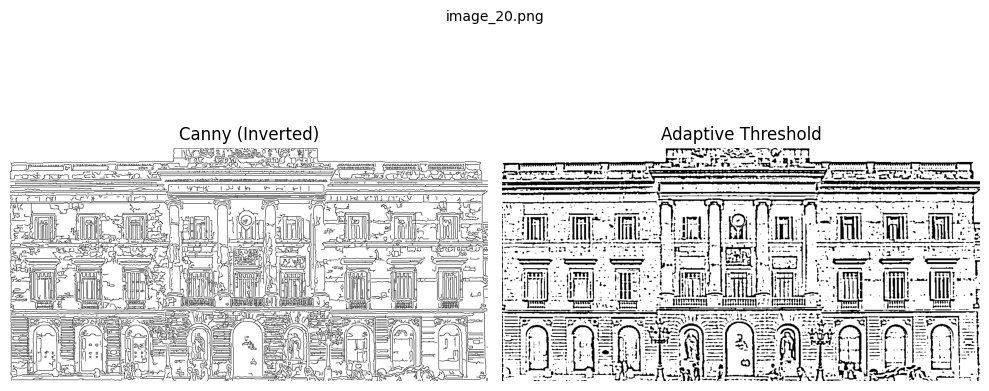

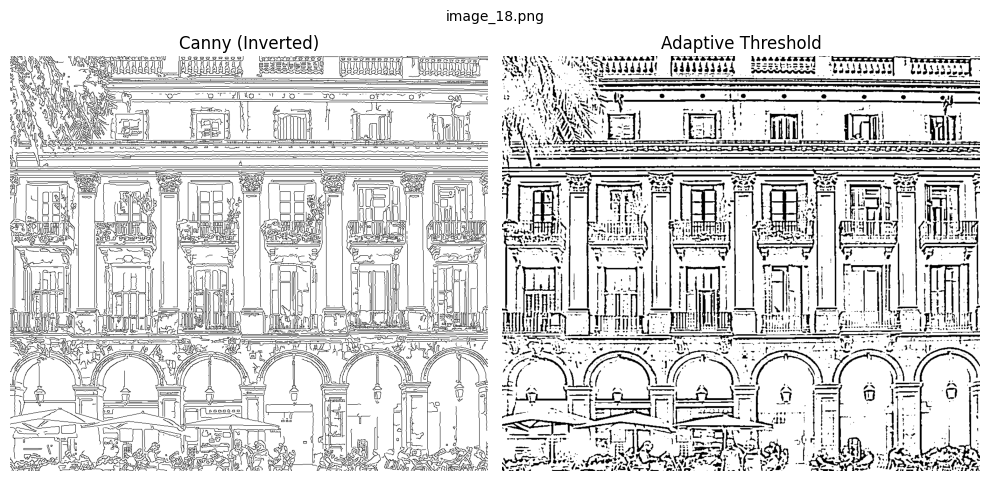

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of image paths
image_paths = [
    '../data/cmp_facade_dataset/images/train/image_15.png',
    '../data/cmp_facade_dataset/images/train/image_17.png',
    '../data/cmp_facade_dataset/images/train/image_18.png',
    '../data/cmp_facade_dataset/images/train/image_19.png',
    '../data/cmp_facade_dataset/images/train/image_20.png',
    '../data/cmp_facade_dataset/images/train/image_18.png'
]

# Store results in a dictionary
cmpresults = {}

for path in image_paths:
    image = cv2.imread(path)
    if image is None:
        print(f"Failed to load: {path}")
        continue

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE to boost local contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    gray_eq = clahe.apply(gray)

    # Blur
    blurred = cv2.GaussianBlur(gray_eq, (5, 5), 0)

    # Improved Canny
    edges = cv2.Canny(blurred, 30, 100)
    sketch = cv2.bitwise_not(edges)

    # Adaptive threshold
    sketch1 = cv2.adaptiveThreshold(blurred, 255,
                                    cv2.ADAPTIVE_THRESH_MEAN_C,
                                    cv2.THRESH_BINARY, 9, 10)

    # Optional morphological fix
    kernel = np.ones((2, 2), np.uint8)
    sketch1_morph = cv2.morphologyEx(sketch1, cv2.MORPH_CLOSE, kernel)


    # Show results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(sketch, cmap='gray')
    plt.title('Canny (Inverted)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(sketch1, cmap='gray')
    plt.title('Adaptive Threshold')
    plt.axis('off')
    plt.suptitle(path.split('/')[-1], fontsize=10)
    plt.tight_layout()
    plt.show()

    # Save in dictionary
    name = path.split('/')[-1]
    cmpresults[name] = {
        'original': image,
        'gray': gray,
        'blurred': blurred,
        'canny_inverted': sketch,
        'adaptive_thresh': sketch1
    }


## **Nelissen Preprocessing**

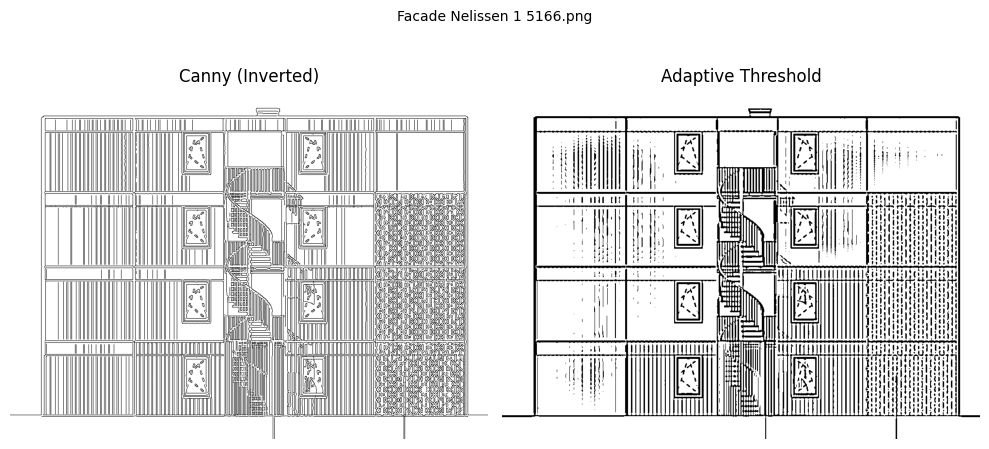

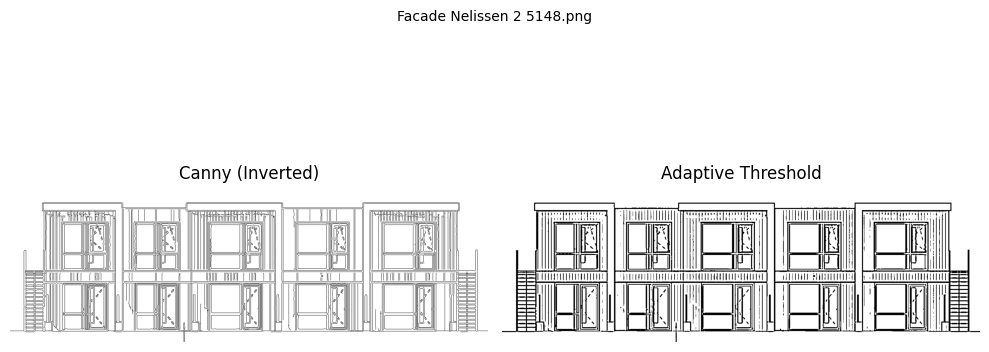

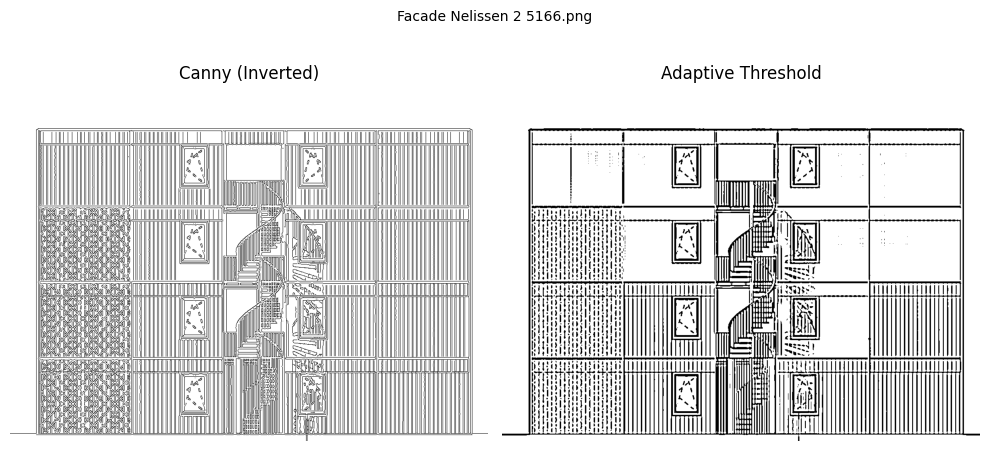

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


# List of image paths
image_paths = [
     "../data-samples/Nelissen Fotos/Facade Nelissen 1 5166.png",
    "../data-samples/Nelissen Fotos/Facade Nelissen 2 5148.png",
    "../data-samples/Nelissen Fotos/Facade Nelissen 2 5166.png"
]

# Store results in a dictionary
nelissenresults = {}

for path in image_paths:
    image = cv2.imread(path)
    if image is None:
        print(f"Failed to load: {path}")
        continue

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE to boost local contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    gray_eq = clahe.apply(gray)

    # Blur
    blurred = cv2.GaussianBlur(gray_eq, (5, 5), 0)

    # Improved Canny
    edges = cv2.Canny(blurred, 30, 100)
    sketch = cv2.bitwise_not(edges)

    # Adaptive threshold
    sketch1 = cv2.adaptiveThreshold(blurred, 255,
                                    cv2.ADAPTIVE_THRESH_MEAN_C,
                                    cv2.THRESH_BINARY, 9, 10)

    # Optional morphological fix
    kernel = np.ones((2, 2), np.uint8)
    sketch1_morph = cv2.morphologyEx(sketch1, cv2.MORPH_CLOSE, kernel)


    # Show results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(sketch, cmap='gray')
    plt.title('Canny (Inverted)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(sketch1, cmap='gray')
    plt.title('Adaptive Threshold')
    plt.axis('off')
    plt.suptitle(path.split('/')[-1], fontsize=10)
    plt.tight_layout()
    plt.show()

    # Save in dictionary
    name = os.path.basename(path)
    nelissenresults[name] = {
        'original': image,
        'gray': gray,
        'blurred': blurred,
        'canny_inverted': sketch,
        'adaptive_thresh': sketch1
    }


## **Comparison between processed Facade and Nelissen images**

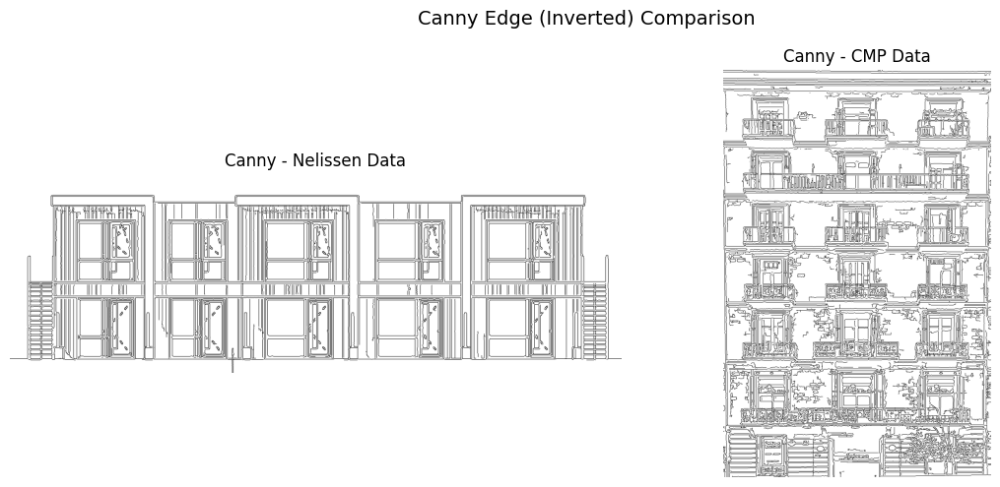

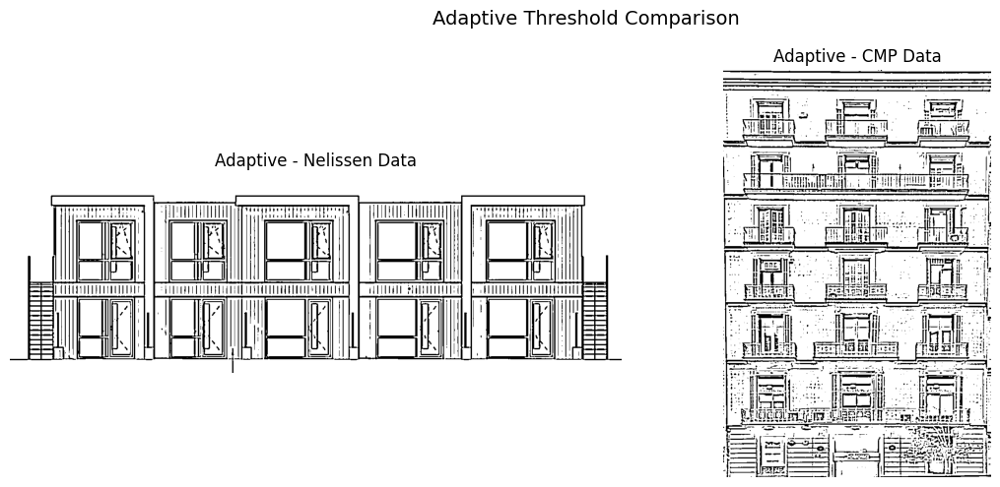

In [25]:
import matplotlib.pyplot as plt

# Pick the image keys
nelissen_key = "Facade Nelissen 2 5148.png"  # fixed: no double ".png"
cmp_key = "image_15.png"

# -- Canny comparison --
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(nelissenresults[nelissen_key].get("canny_inverted", np.zeros((10, 10))), cmap='gray')
plt.title("Canny - Nelissen Data")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cmpresults[cmp_key].get("canny_inverted", np.zeros((10, 10))), cmap='gray')
plt.title("Canny - CMP Data")
plt.axis('off')

plt.suptitle("Canny Edge (Inverted) Comparison", fontsize=14)
plt.tight_layout()
plt.show()

# -- Adaptive threshold (optionally with morphology) --
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(nelissenresults[nelissen_key].get("adaptive_thresh", np.zeros((10, 10))), cmap='gray')
plt.title("Adaptive - Nelissen Data")
plt.axis('off')

plt.subplot(1, 2, 2)

# Try to show "adaptive_thresh_morph" if available, fallback to "adaptive_thresh"
adaptive_cmp = cmpresults[cmp_key].get("adaptive_thresh_morph") or cmpresults[cmp_key]["adaptive_thresh"]
plt.imshow(adaptive_cmp, cmap='gray')
plt.title("Adaptive - CMP Data")
plt.axis('off')

plt.suptitle("Adaptive Threshold Comparison", fontsize=14)
plt.tight_layout()
plt.show()


## **Conclusion:**

From the results, this preprocessing works quite well, especially on the Nelissen images. The Nelissen facades look clearer because all the parts are drawn properly, while in the CMP images some details are missing or harder to see — probably because of things like shadows or dirt in the photos.

Overall, adaptive thresholding seems to work a bit better than Canny, at least visually. Now it's up to the model to see which one actually performs better during training.

# **Only Greyscaling Preprocessing**

### **CMP Dataset**

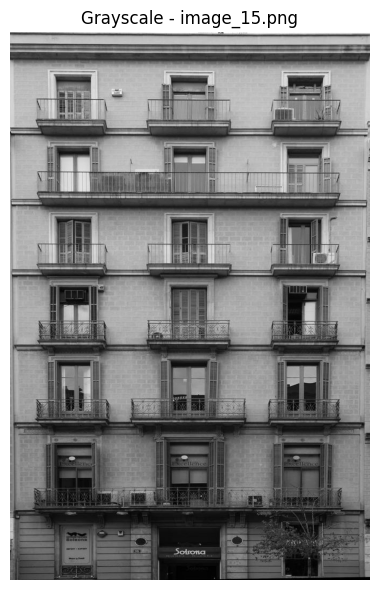

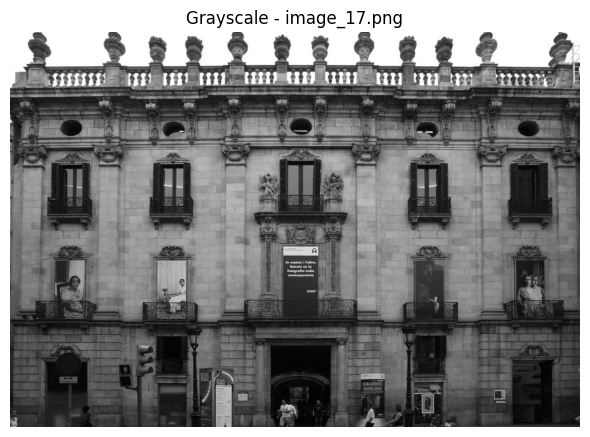

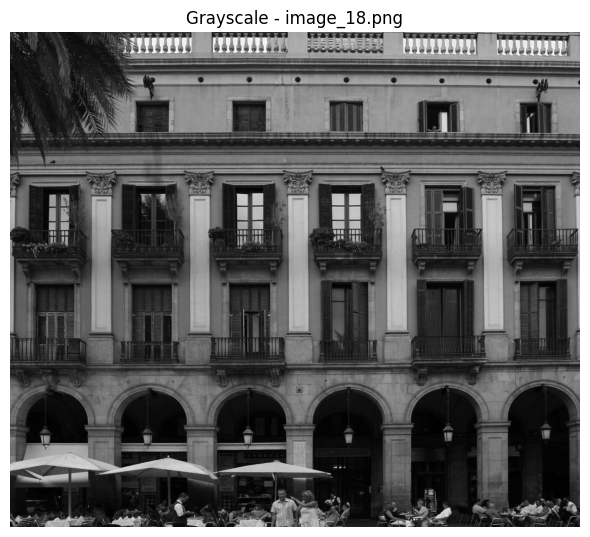

In [ ]:
import cv2
import matplotlib.pyplot as plt

# List of image paths
image_paths = [
    '../data/cmp_facade_dataset/images/train/image_15.png',
    '../data/cmp_facade_dataset/images/train/image_17.png',
    '../data/cmp_facade_dataset/images/train/image_18.png'
]

# Store results
cmpgreyresults = {}

for path in image_paths:
    image = cv2.imread(path)
    if image is None:
        print(f"Failed to load: {path}")
        continue

    # Convert to grayscale only
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Show grayscale image
    plt.figure(figsize=(6, 6))
    plt.imshow(gray, cmap='gray')
    plt.title(f"Grayscale - {path.split('/')[-1]}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Save to dictionary
    name = path.split('/')[-1]
    cmpgreyresults[name] = {
        'original': image,
        'gray': gray
    }


### **Nelissen Data**


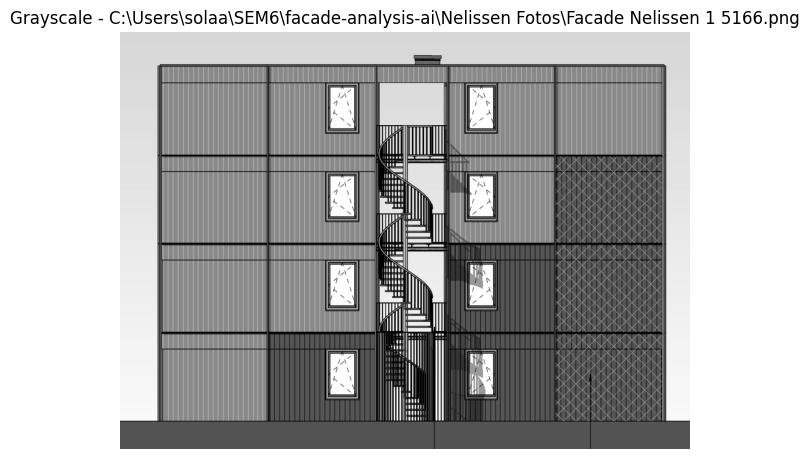

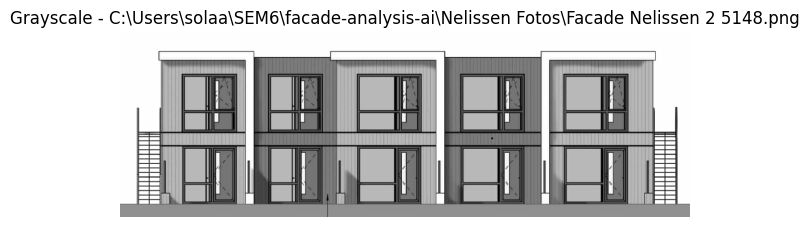

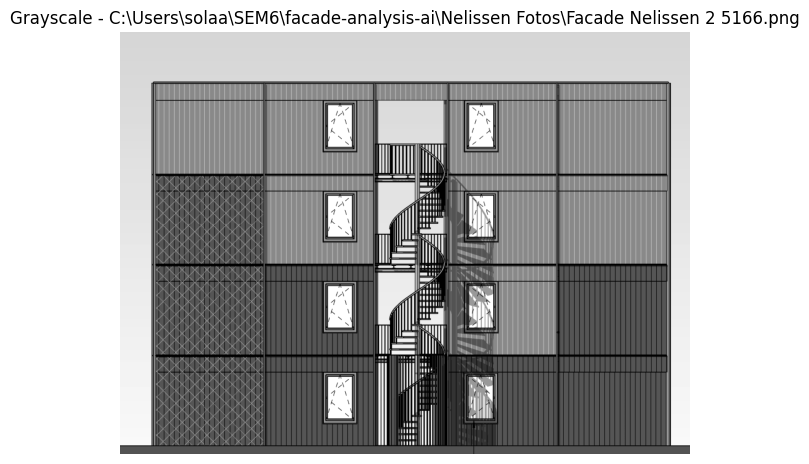

In [16]:
import cv2
import matplotlib.pyplot as plt

# List of image paths
image_paths = [
        r"C:\Users\solaa\SEM6\facade-analysis-ai\Nelissen Fotos\Facade Nelissen 1 5166.png",
    r"C:\Users\solaa\SEM6\facade-analysis-ai\Nelissen Fotos\Facade Nelissen 2 5148.png",
    r"C:\Users\solaa\SEM6\facade-analysis-ai\Nelissen Fotos\Facade Nelissen 2 5166.png"
]

# Store results
nelissengreyresults = {}

for path in image_paths:
    image = cv2.imread(path)
    if image is None:
        print(f"Failed to load: {path}")
        continue

    # Convert to grayscale only
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Show grayscale image
    plt.figure(figsize=(6, 6))
    plt.imshow(gray, cmap='gray')
    plt.title(f"Grayscale - {path.split('/')[-1]}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Save to dictionary
    name = path.split('/')[-1]
    nelissengreyresults[name] = {
        'original': image,
        'gray': gray
    }
